In [1]:
#import packages
import Tool
import numpy as np
import numpy.matlib
from numpy import linalg as LA
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import skimage
import skimage.feature
import scipy
from scipy import linalg as SLA
import cv2
import os
import time
import search

/home/yunhao/anaconda3/envs/py36/lib/python3.7/site-packages/sklearn/base.py:306: UserWarning: Trying to unpickle estimator SVC from version 0.20.3 when using version 0.21.3. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)


In [4]:
def get_config(config_name):
    
    return np.ones((5,4,4)).astype()

In [ ]:
Ims = []
for i in range(1,23):
    Im = Tool.imread('Images/aerobic-'+str(i).zfill(3)+'.bmp')
    Ims.append(Im)
print(len(Ims))

In [63]:
def bwmorph(img, option):
    if option == 'dilate':
        outIm = np.zeros(img.shape)
        for r in range(1,img.shape[0]-1):
            for c in range(1,img.shape[1]-1):
                if img[r,c] == 1:
                    outIm[r-1:r+2,c-1:c+2]=1
        return outIm
    elif option == 'erosion':
        outIm = np.zeros(img.shape)
        for r in range(1,img.shape[0]-1):
            for c in range(1,img.shape[1]-1):
                if np.sum(img[r-1:r+2,c-1:c+2]) == 9:
                    outIm[r,c] = 1
        return outIm
    elif option == 'closing':
        outIm = bwmorph(img,'dilate')
        outIm = bwmorph(outIm,'erosion')
        return outIm
    elif option == 'opening':
        outIm = bwmorph(img,'erosion')
        outIm = bwmorph(outIm,'dilate')
        return outIm
    elif option == '4':
        outIm = img.copy()
        for r in range(1,img.shape[0]-1):
            for c in range(1,img.shape[1]-1):
                if img[r-1,c]+img[r,c-1]+img[r,c+1]+img[r+1,c] == 0:
                    outIm[r,c] = 0
        return outIm
    else:
        return img

In [ ]:
t1 = 98.5
t2 = 150
'''
valid option values are:
    None
    'dilate'
    'erosion'
    'closing'
    'opening'
    '4'
'''
option = 'closing'
result_folder = 'result'
if not os.path.exists(result_folder): os.mkdir(result_folder)
question_folder = result_folder+'/question1'
if not os.path.exists(question_folder): os.mkdir(question_folder)
T_folder = question_folder+'/t1_'+str(t1)
if not os.path.exists(T_folder): os.mkdir(T_folder)
raw_folder = T_folder+'/raw'
if not os.path.exists(raw_folder): os.mkdir(raw_folder)
clean_folder = T_folder+'/clean_t2_'+str(t2) if not option else T_folder+'/clean_'+option+'_t2_'+str(t2)
if not os.path.exists(clean_folder): os.mkdir(clean_folder)
diff_Ims = []
for i in range(len(Ims)-1):
    diff_Im = np.abs(Ims[i+1]-Ims[i])
    T = Tool.getT(diff_Im,t1)
    diff_Im[diff_Im>T] = 1
    diff_Im[diff_Im<=T] = 0
    Tool.imwrite(diff_Im,raw_folder+'/'+str(i)+'_'+str(i+1)+'.bmp')
    diff_Im = bwmorph(diff_Im, option)
    L, num = skimage.measure.label(diff_Im, 8,return_num=True)
    unique, counts = np.unique(L, return_counts=True)
    for j in range(len(unique)-1,0,-1):
        if counts[j]<t2:
            counts = np.delete(counts,j)
            unique = np.delete(unique,j)
    counts = np.delete(counts,0)
    unique = np.delete(unique,0)
#     print('unique')
#     print(unique)
#     print('counts')
#     print(counts)
    diff_Im = np.isin(L, unique.tolist()).astype(np.uint8)
    diff_Ims.append(diff_Im)
    Tool.imwrite(diff_Im,clean_folder+'/'+str(i)+'_'+str(i+1)+'.bmp')
    print(i,end='\r')

In [ ]:
def normalize(img, normType=1):
    # Normalize the input image
    # Transform its range to [0, 1]
    #img = img.astype(np.uint8)
    if normType == 1:
        img = img - img.min()
        return img/img.max()
    elif normType == 2:
        img = img - img.min()
        return img + img.mean()
    elif normType == 3:
        img = img - img.min()
        return img/img.max()

In [ ]:
def get_mean(img):
    m00 = np.sum(img)
    r,c = img.shape
    r,c = np.ogrid[0:r,0:c]
    m01 = np.sum(r*img)
    m10 = np.sum(c*img)
    return m10/m00,m01/m00

In [ ]:
def similitudeMoment(img,ij):
    i,j=ij
    r,c = img.shape
    r,c = np.ogrid[0:r,0:c]
    c_bar, r_bar = get_mean(img)
    r = np.power(r-r_bar,j)
    c = np.power(c-c_bar,i)
#     im = np.dot(r,c)*img/np.power(np.sum(img),(i+j)/2+1)/np.power(np.sum(img),(i+j)/2+1)
#     Tool.imshow(im,title=str(ij))
#     print(np.power(np.sum(img),(i+j)/2+1))
    return round(np.sum(np.dot(r,c)*img)/np.power(np.sum(img),(i+j)/2+1),4)

In [ ]:
def similitudeMoments(img):
    ijs= [(0,2),(0,3),(1,1),(1,2),(2,0),(2,1),(3,0)]
    result=[]
    for ij in ijs:
        result.append(similitudeMoment(img,ij))
    return result

In [ ]:
question_folder = result_folder+'/question2'
if not os.path.exists(question_folder): os.mkdir(question_folder)
MHI = np.zeros(Ims[0].shape)
s = len(Ims)
s = len(Ims)-s
for i in range(len(Ims)-1):
    for r in range(0,Ims[0].shape[0]):
        for c in range(0,Ims[0].shape[1]):
            if diff_Ims[i][r,c] > 0:
                MHI[r,c] = max(0,i+2-s)
    print(i,end='\r')
MHI = normalize(MHI)
MEI = (MHI>0).astype(np.uint8)
Tool.imshow(MHI)
Tool.imshow(MEI)
MHI_moment = similitudeMoments(MHI)
MEI_moment = similitudeMoments(MEI)
print(MHI_moment)
print(MEI_moment)

if option:
    Tool.imwrite(MHI,question_folder+'/MHI_'+option+'_'+str(t1)+'_'+str(t2)+'.jpg')
    Tool.imwrite(MEI,question_folder+'/MEI_'+option+'_'+str(t1)+'_'+str(t2)+'.jpg')
else:
    Tool.imwrite(MHI,question_folder+'/MHI_'+'_'+str(t1)+'_'+str(t2)+'.jpg')
    Tool.imwrite(MEI,question_folder+'/MEI_'+'_'+str(t1)+'_'+str(t2)+'.jpg')


In [ ]:
if __name__ == '__main__':
    i = 0
    ImgName = np.ones((10,10))
    
    config = get_config('config_name')
    
    for frame_config in config:
        r,c,h,w = frame_config
        print(r)
        for i in range(4):
            img1 = np.ones((10,10))[r[i]:r[i]+h[i],c[i]:c[i]+w[i]]
        
        

In [86]:
def sort_index(blocks):
    ind_list = []
    for i in range(4):
        _,_,ci,_,_ = blocks[i]
        for j in range(4):
            if len(ind_list)<=j:
                ind_list.append(blocks[i])
                break
            else:
                _,_,cj,_,_ = ind_list[j]
                if ci < cj:
                    ind_list.insert(j,blocks[i])
                    break
    return ind_list

In [88]:
result_folder = 'result'
if not os.path.exists(result_folder): os.mkdir(result_folder)
p1_folder = result_folder + '/p1'
if not os.path.exists(p1_folder): os.mkdir(p1_folder)
p2_folder = result_folder + '/p2'
if not os.path.exists(p2_folder): os.mkdir(p2_folder)
p3_folder = result_folder + '/p3'
if not os.path.exists(p3_folder): os.mkdir(p3_folder)
p4_folder = result_folder + '/p4'
if not os.path.exists(p4_folder): os.mkdir(p4_folder)
p_folder = [p1_folder,p2_folder,p3_folder,p4_folder]


t1 = 99
t2 = 150
option = 'closing'
videoCapture = cv2.VideoCapture('../data/video/OHIO/1.mp4')
fps = videoCapture.get(cv2.CAP_PROP_FPS)
size = (int(videoCapture.get(cv2.CAP_PROP_FRAME_WIDTH)),
        int(videoCapture.get(cv2.CAP_PROP_FRAME_HEIGHT)))
print(fps)
print(type(videoCapture))
success = True
count = 0
Ims = []
success, image = videoCapture.read()
config = None
scaler = 1.5
diff = [[],[],[],[]]
old_person = [0]*4
person = [0]*4
while success:
    if not config:
        image_RGB = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        print(image.max())
        blocks = search.search(image_RGB)
        blocks = sort_index(blocks)
        config = blocks
        for i in range(4):
            v,r,c,h,w = config[i]
            config[i] = (v,
                         max(0,int(r+(1-scaler)*h/2)),
                         max(0,int(c+(1-scaler)*w/2)),
                         int(h*scaler),
                         int(w*scaler))
            print(config[i])
            old_person[i] = image[config[i][1]:config[i][1]+config[i][3],config[i][2]:config[i][2]+config[i][4]]
    else:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        for i in range(4):
            person[i] = image[config[i][1]:config[i][1]+config[i][3],config[i][2]:config[i][2]+config[i][4]]
            Tool.imwrite(person[i],p_folder[i]+'/' + str(count) + '.png')
    success, image = videoCapture.read()
    count += 1
    print('Read a new frame:', count,end='\r')



59.94005994005994
<class 'cv2.VideoCapture'>
250


/home/yunhao/anaconda3/envs/py36/lib/python3.7/site-packages/skimage/transform/_warps.py:23: UserWarning: The default multichannel argument (None) is deprecated.  Please specify either True or False explicitly.  multichannel will default to False starting with release 0.16.
  warn('The default multichannel argument (None) is deprecated.  Please '
/home/yunhao/anaconda3/envs/py36/lib/python3.7/site-packages/skimage/transform/_warps.py:23: UserWarning: The default multichannel argument (None) is deprecated.  Please specify either True or False explicitly.  multichannel will default to False starting with release 0.16.
  warn('The default multichannel argument (None) is deprecated.  Please '
/home/yunhao/anaconda3/envs/py36/lib/python3.7/site-packages/skimage/transform/_warps.py:23: UserWarning: The default multichannel argument (None) is deprecated.  Please specify either True or False explicitly.  multichannel will default to False starting with release 0.16.
  warn('The default multich

(0.9999999680671809, 0, 176, 768, 384)
(0.9999999999999699, 72, 416, 768, 384)
(0.9999999999999699, 72, 596, 768, 384)
(0.9999999627886365, 52, 816, 768, 384)


59.94005994005994
<class 'cv2.VideoCapture'>
250


/home/yunhao/anaconda3/envs/py36/lib/python3.7/site-packages/skimage/transform/_warps.py:23: UserWarning: The default multichannel argument (None) is deprecated.  Please specify either True or False explicitly.  multichannel will default to False starting with release 0.16.
  warn('The default multichannel argument (None) is deprecated.  Please '
/home/yunhao/anaconda3/envs/py36/lib/python3.7/site-packages/skimage/transform/_warps.py:23: UserWarning: The default multichannel argument (None) is deprecated.  Please specify either True or False explicitly.  multichannel will default to False starting with release 0.16.
  warn('The default multichannel argument (None) is deprecated.  Please '
/home/yunhao/anaconda3/envs/py36/lib/python3.7/site-packages/skimage/transform/_warps.py:23: UserWarning: The default multichannel argument (None) is deprecated.  Please specify either True or False explicitly.  multichannel will default to False starting with release 0.16.
  warn('The default multich

<class 'matplotlib.figure.Figure'>


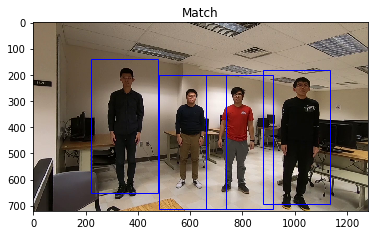

In [98]:
result_folder = 'result'
if not os.path.exists(result_folder): os.mkdir(result_folder)
whole_folder = result_folder + '/whole'
if not os.path.exists(whole_folder): os.mkdir(whole_folder)


t1 = 99
t2 = 150
option = 'closing'
videoCapture = cv2.VideoCapture('../data/video/OHIO/4.mp4')
fps = videoCapture.get(cv2.CAP_PROP_FPS)
size = (int(videoCapture.get(cv2.CAP_PROP_FRAME_WIDTH)),
        int(videoCapture.get(cv2.CAP_PROP_FRAME_HEIGHT)))
print(fps)
print(type(videoCapture))
success = True
count = 0
Ims = []
success, image = videoCapture.read()
config = None
scaler = 1
diff = [[],[],[],[]]
old_person = [0]*4
person = [0]*4
out = cv2.VideoWriter('output.avi', -1, 30., (1280,720))

while success:
    image_RGB = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    print(image.max())
    blocks = search.search(image_RGB)
#         print(blocks)
    blocks = sort_index(blocks)
#         print(blocks)
    config = blocks
    for i in range(4):
        v,r,c,h,w = config[i]
#         config[i] = (v,
#                      max(0,int(r+(1-scaler)*h/2)),
#                      max(0,int(c+(1-scaler)*w/2)),
#                      int(h*scaler),
#                      int(w*scaler))
#         print(config[i])
        old_person[i] = image[config[i][1]:config[i][1]+config[i][3],config[i][2]:config[i][2]+config[i][4]]
#     print(wtf)

    fig,ax = plt.subplots(1)
    ax.imshow(image_RGB)
    i = 0
    for element in blocks:
        _,r,c,height,width = element
        rect = patches.Rectangle((c,r),width,height,linewidth=1,edgecolor='b',facecolor='none')
        ax.add_patch(rect)
        i += 1
    plt.title('Match')
    print(type(fig))
    break
    out.write(fig)
#     plt.savefig(whole_folder + '/HoG_' + str(count) + '.png',dpi=300)
    plt.show
    
    success, image = videoCapture.read()
    count += 1
    print('Read a new frame:', count,end='\r')
# Ims = np.array(Ims)



<class 'cv2.VideoWriter'>


/home/yunhao/Documents/O-H-I-O-Posture-Detection/src/Tool.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


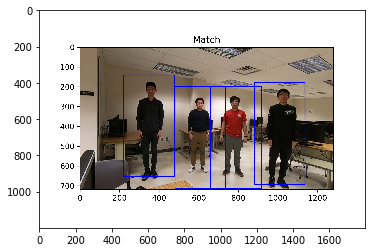

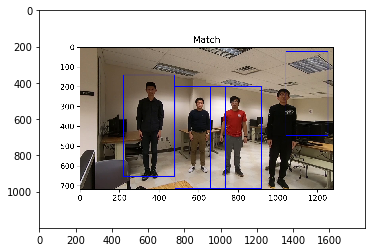

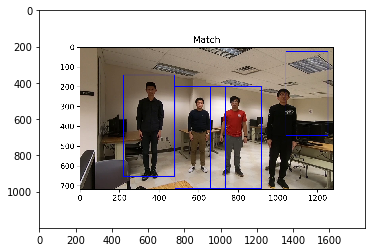

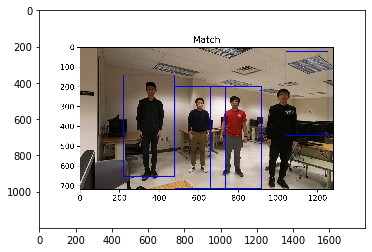

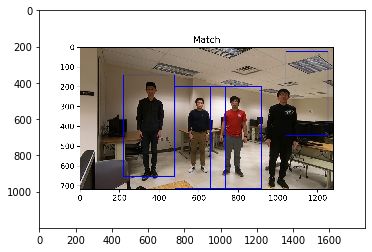

...

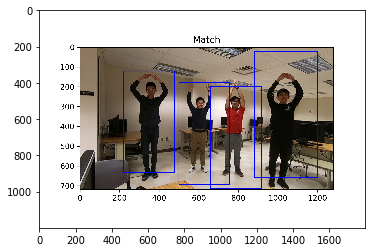

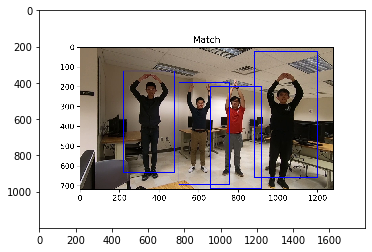

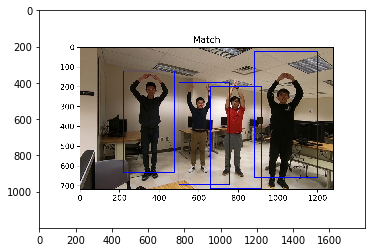

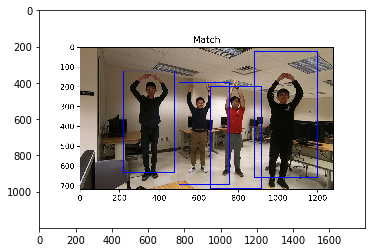

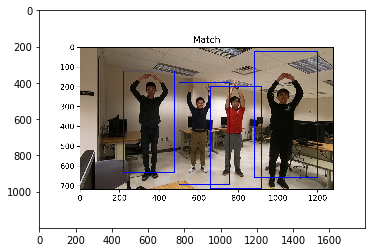

In [105]:
out = cv2.VideoWriter('output.avi', -1, 30., (1280,720))
print(type(out))
for i in range(174):
    img = Tool.imread('result/whole/HoG_'+str(i)+'.png')
#     Tool.imshow(img)
    out.write(img)
out.release()

In [ ]:
result_folder = 'result'
if not os.path.exists(result_folder): os.mkdir(result_folder)
p1_folder = result_folder + '/p1'
if not os.path.exists(p1_folder): os.mkdir(p1_folder)
p2_folder = result_folder + '/p2'
if not os.path.exists(p2_folder): os.mkdir(p2_folder)
p3_folder = result_folder + '/p3'
if not os.path.exists(p3_folder): os.mkdir(p3_folder)
p4_folder = result_folder + '/p4'
if not os.path.exists(p4_folder): os.mkdir(p4_folder)
p_folder = [p1_folder,p2_folder,p3_folder,p4_folder]


t1 = 99
t2 = 150
option = 'closing'
videoCapture = cv2.VideoCapture('../data/video/OHIO/1.mp4')
fps = videoCapture.get(cv2.CAP_PROP_FPS)
size = (int(videoCapture.get(cv2.CAP_PROP_FRAME_WIDTH)),
        int(videoCapture.get(cv2.CAP_PROP_FRAME_HEIGHT)))
print(fps)
print(type(videoCapture))
success = True
count = 0
Ims = []
success, image = videoCapture.read()
config = None
scaler = 1.5
diff = [[],[],[],[]]
old_person = [0]*4
person = [0]*4
while success:
    if not config:
        image_RGB = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        print(image.max())
        blocks = search.search(image_RGB)
#         print(blocks)
        blocks = sort_index(blocks)
#         print(blocks)
        config = blocks
        for i in range(4):
            v,r,c,h,w = config[i]
            config[i] = (v,
                         max(0,int(r+(1-scaler)*h/2)),
                         max(0,int(c+(1-scaler)*w/2)),
                         int(h*scaler),
                         int(w*scaler))
            print(config[i])
            old_person[i] = image[config[i][1]:config[i][1]+config[i][3],config[i][2]:config[i][2]+config[i][4]]
#         break
#     print()
    else:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        for i in range(4):
            person[i] = image[config[i][1]:config[i][1]+config[i][3],config[i][2]:config[i][2]+config[i][4]]
            Tool.imwrite(person[i],p_folder[i]+'/' + str(count) + '.png')
#             Tool.imshow(person[i])
#             Tool.imshow(old_person[i])
#             diff_img = np.abs(person[i]-old_person[i])
#             T = Tool.getT(diff_img,t1)
#             Tool.imshow(diff_img)
#             print(diff_img.max(),diff_img.min(),T)
#             diff_img[diff_img<T] = 0
#             diff_img[diff_img>=T] = 1
#             Tool.imshow(diff_img)
#             print(diff_img.max(),diff_img.min(),T)
            
            
#             diff_img = bwmorph(diff_img, option)
#             L, num = skimage.measure.label(diff_img, 8,return_num=True)
#             unique, counts = np.unique(L, return_counts=True)
#             for j in range(len(unique)-1,0,-1):
#                 if counts[j]<t2:
#                     counts = np.delete(counts,j)
#                     unique = np.delete(unique,j)
#             counts = np.delete(counts,0)
#             unique = np.delete(unique,0)
        #     print('unique')
        #     print(unique)
        #     print('counts')
        #     print(counts)
#             diff_img = np.isin(L, unique.tolist()).astype(np.uint8)
#             Tool.imshow(diff_img)
#             break
#             diff[i].append(diff_img)
#             Tool.imwrite(diff_img*255,p_folder[i]+'/' + str(count) + '.png')
#             old_person[i] = person[i]
    #     Tool.imshow(p1)
    #     Tool.imshow(p2)
    #     Tool.imshow(p3)
    #     Tool.imshow(p4)
#         persion[0].append(diff_p1)
#         persion[1].append(diff_p2)
#         persion[2].append(diff_p3)
#         persion[3].append(diff_p4)
#         Tool.imwrite(p1,p1_folder+'/p1_' + str(count) + '.png')
#         Tool.imwrite(p2,p2_folder+'/p2_' + str(count) + '.png')
#         Tool.imwrite(p3,p3_folder+'/p3_' + str(count) + '.png')
#         Tool.imwrite(p4,p4_folder+'/p4_' + str(count) + '.png')
#     if count == 1: break
#     Ims.append(image)
    success, image = videoCapture.read()
    count += 1
    print('Read a new frame:', count,end='\r')
# Ims = np.array(Ims)



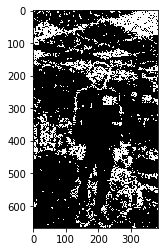

In [61]:
Tool.imshow(diff[0][0])

/home/yunhao/anaconda3/envs/py36/lib/python3.7/site-packages/skimage/transform/_warps.py:23: UserWarning: The default multichannel argument (None) is deprecated.  Please specify either True or False explicitly.  multichannel will default to False starting with release 0.16.
  warn('The default multichannel argument (None) is deprecated.  Please '
/home/yunhao/anaconda3/envs/py36/lib/python3.7/site-packages/skimage/transform/_warps.py:23: UserWarning: The default multichannel argument (None) is deprecated.  Please specify either True or False explicitly.  multichannel will default to False starting with release 0.16.
  warn('The default multichannel argument (None) is deprecated.  Please '
/home/yunhao/anaconda3/envs/py36/lib/python3.7/site-packages/skimage/transform/_warps.py:23: UserWarning: The default multichannel argument (None) is deprecated.  Please specify either True or False explicitly.  multichannel will default to False starting with release 0.16.
  warn('The default multich

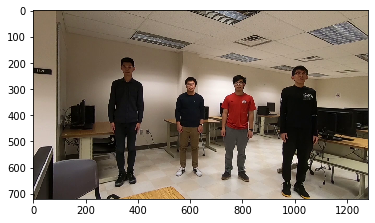

In [4]:
Tool.imshow(Ims[0])
wtf = search.search(Ims[0])

[(0.9999999999999699, 200, 660, 512, 256), (0.9999999999999699, 200, 480, 512, 256), (0.9999999680671809, 120, 240, 512, 256), (0.9999999627886365, 180, 880, 512, 256), (0.9951341644094702, 20, 1040, 427, 213), (0.9642697182069306, 100, 80, 427, 213)]


<function matplotlib.pyplot.show(*args, **kw)>

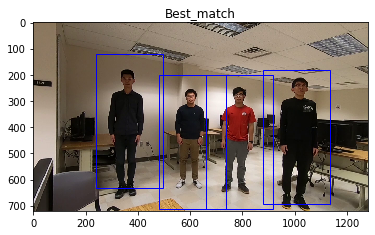

In [6]:
print(wtf)

fig,ax = plt.subplots(1)
ax.imshow(Ims[0])
i = 0
for element in wtf:
    _,r,c,height,width = element
    rect = patches.Rectangle((c,r),width,height,linewidth=1,edgecolor='b',facecolor='none')
    ax.add_patch(rect)
    i += 1
    if i == 4: break
plt.title('Best_match')
plt.savefig('Best_match.png',dpi=300)
plt.show

In [ ]:
t1 = 98.5
t2 = 150
'''
valid option values are:
    None
    'dilate'
    'erosion'
    'closing'
    'opening'
    '4'
'''

folder = 'result'
if not os.path.exists(folder): os.mkdir(folder)
    
    
option = 'closing'
clean_folder = T_folder+'/clean_t2_'+str(t2) if not option else T_folder+'/clean_'+option+'_t2_'+str(t2)
if not os.path.exists(clean_folder): os.mkdir(clean_folder)
    
    
option = 'closing'
diff_Ims = []
for i in range(len(Ims)-1):
    diff_Im = np.abs(Ims[i+1]-Ims[i])
    T = Tool.getT(diff_Im,t1)
    diff_Im[diff_Im>T] = 1
    diff_Im[diff_Im<=T] = 0
    Tool.imwrite(diff_Im,raw_folder+'/'+str(i)+'_'+str(i+1)+'.bmp')
    diff_Im = bwmorph(diff_Im, option)
    L, num = skimage.measure.label(diff_Im, 8,return_num=True)
    unique, counts = np.unique(L, return_counts=True)
    for j in range(len(unique)-1,0,-1):
        if counts[j]<t2:
            counts = np.delete(counts,j)
            unique = np.delete(unique,j)
    counts = np.delete(counts,0)
    unique = np.delete(unique,0)
#     print('unique')
#     print(unique)
#     print('counts')
#     print(counts)
    diff_Im = np.isin(L, unique.tolist()).astype(np.uint8)
    diff_Ims.append(diff_Im)
    Tool.imwrite(diff_Im,clean_folder+'/'+str(i)+'_'+str(i+1)+'.bmp')
    print(i,end='\r')